In [1]:
from writers import SegmentationSaver
from analyzers import BacteriaSegmenter
from datasets import TomographyDatasetSlices
from utils.data_factory import DataFactory
from image_processing_pipelines import ThresholdClusterPipeline
import os
import cv2
import matplotlib.pyplot as plt

In [2]:
TOMO_PATH = ["/home/matiasgp/groups/grp_tomo_db1_d3/nobackup/archive/TomoDB1_d3/Hneptunium_secretin"]

In [3]:
def normalize_min_max(arr):
    # Ensure array is in floating point format for division
    arr = arr.astype(np.float32)
    
    # Compute min and max
    min_val = arr.min()
    max_val = arr.max()
    
    # Perform normalization
    arr = (arr - min_val) / (max_val - min_val)
    
    return arr

import numpy as np

def normalize_standardization(arr):
    # Ensure array is in floating point format for division
    arr = arr.astype(np.float32)
    
    # Compute mean and standard deviation
    mean = arr.mean()
    std = arr.std()
    
    # Avoid division by zero
    std = np.where(std == 0, 1, std)
    
    # Perform normalization
    arr = (arr - mean) / std
    
    return arr

In [4]:
def histogram_equalization(image):
    # Flatten the image array and calculate histogram
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 1])

    # Calculate cumulative distribution function (CDF)
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf.max()  # Normalize CDF

    # Use linear interpolation of the CDF to find new pixel values
    image_equalized = np.interp(image.flatten(), bins[:-1], cdf_normalized)

    # Reshape the flattened image back to the original shape
    image_equalized = image_equalized.reshape(image.shape)
    
    return image_equalized

In [9]:
def apply_contrast(bacteria, factor):
    mean = np.mean(bacteria, axis=(0,1), keepdims=True)
    image_contrast = mean + factor * (bacteria - mean)
    image_contrast = np.clip(image_contrast, 0.0, 1.0)
    return image_contrast

In [36]:
def plot_with_colormaps(image):
    # List of colormaps to test
    colormaps = [
        'Blues','BuGn', "PRGn", "Reds", "YlGnBu"
, "gray_r", "ocean", "plasma_r", "viridis_r"]

    # Plot image using all colormaps
    num_colormaps = len(colormaps)
    num_cols = 5  # Number of columns in the plot grid
    num_rows = (num_colormaps + num_cols - 1) // num_cols  # Calculate number of rows needed

    plt.figure(figsize=(15, 3 * num_rows))

    for i, cmap in enumerate(colormaps):
        plt.subplot(num_rows, num_cols, i + 1)
        plt.imshow(image, cmap=cmap)
        plt.title(cmap)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [37]:
print("Compiling Dataset...")
data = TomographyDatasetSlices(TOMO_PATH)

Compiling Dataset...


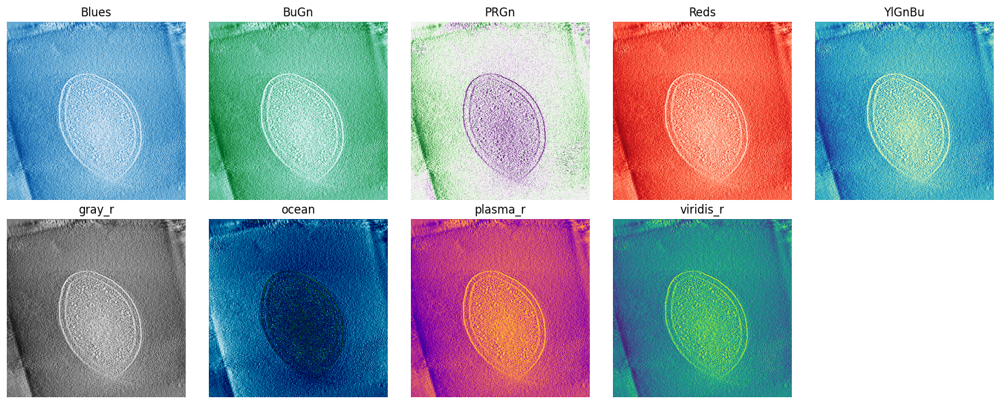

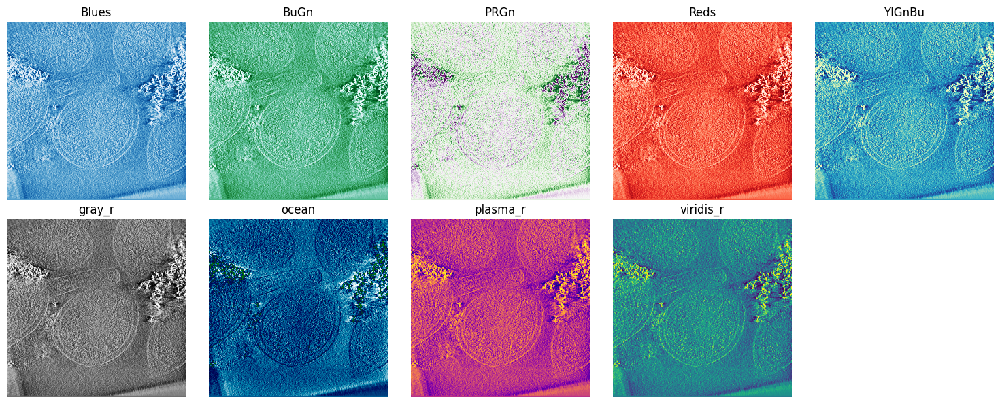

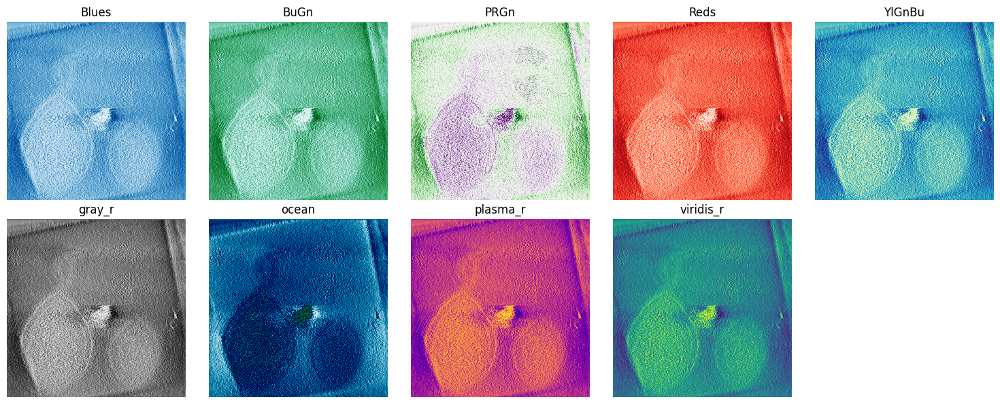

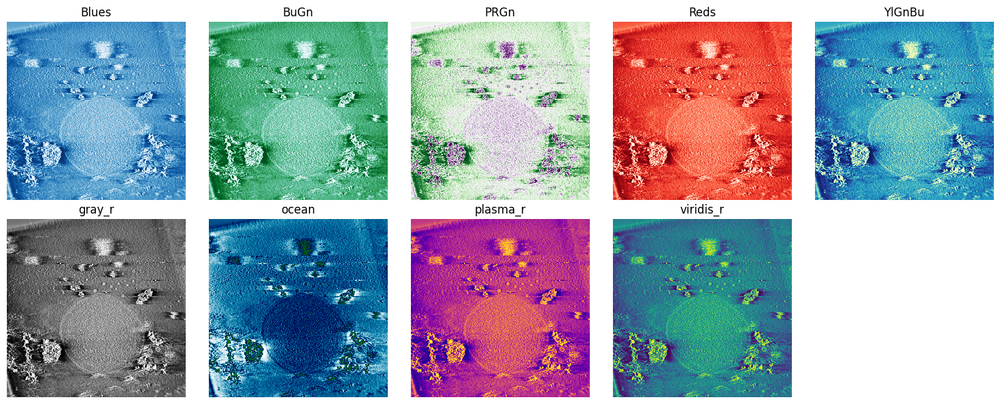

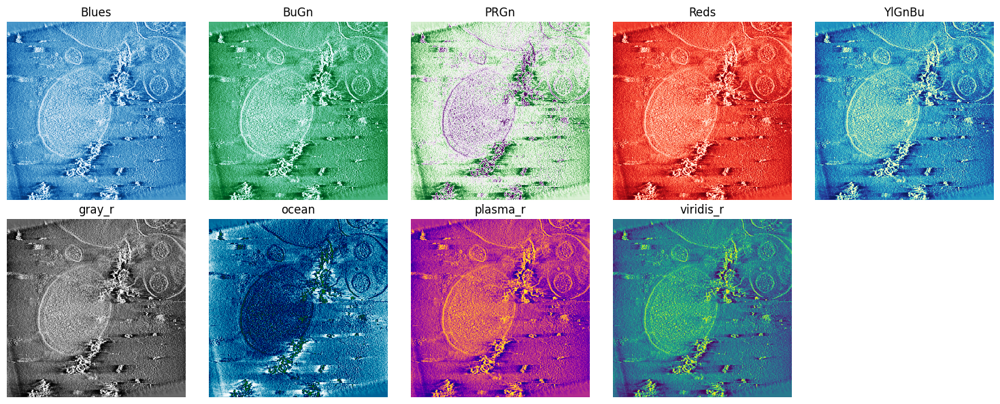

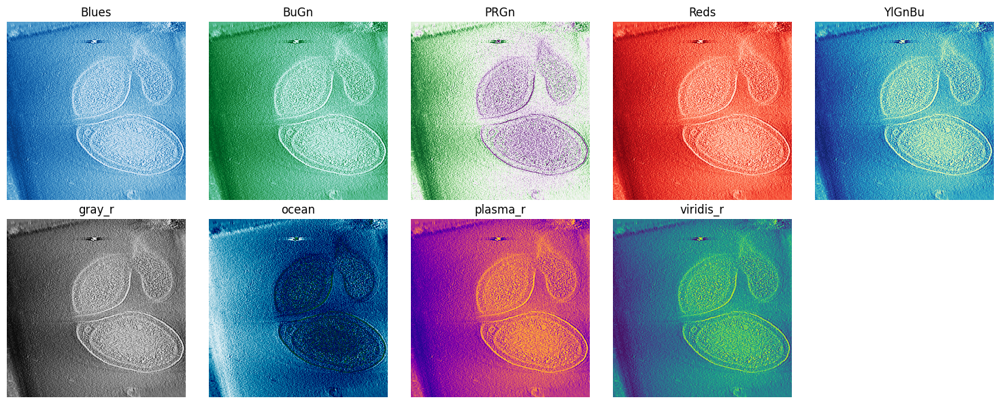

In [38]:
for i in range(data.__len__()):
    
    d = data.pop()
    #normalize and equalize image
    n_data = normalize_min_max(d["data"])
    equalized_image = histogram_equalization(n_data)

    plot_with_colormaps(equalized_image)